In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

tryb obrazu RGB
rozmiar (409, 311)


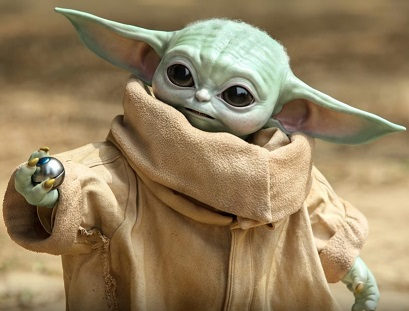

In [2]:
im = Image.open('baby_yoda.jpg')
print("tryb obrazu", im.mode)
print("rozmiar", im.size)
im

In [3]:
def zakres(w, h):  # funkcja, która uprości podwójna petle for
    return [(i, j) for i in range(w) for j in range(h)]

zmiana wartości pikseli za pomocą metod getpixel i putpixel

In [4]:
def pobierz_kolor_pixela(obraz, m, n):  # m, n współrzędne punktu na obrazie
    w, h = obraz.size
    if m < w and n < h:
        kolor = obraz.getpixel((m, n))
    return kolor


print(pobierz_kolor_pixela(im, 260, 200))

(154, 126, 89)


In [5]:
def wstaw_pixel_w_punkt(obraz, m, n, kolor):  # m, n współrzędne punktu na obrazie, kolor -  dane pixela do wstawienia
    w, h = obraz.size
    if m < w and n < h:
        obraz.putpixel((m, n), kolor)
    return obraz


def wstaw_pixel_w_zakresie(obraz, m, n, kolor, w_z, h_z):  # w miejscu m,n wstawia prostokąt o bokach w_z, h_z
    w, h = obraz.size
    for i, j in zakres(w_z, h_z):
        if i + m < w and j + n < h:
            obraz.putpixel((i + m, j + n), kolor)
    return obraz

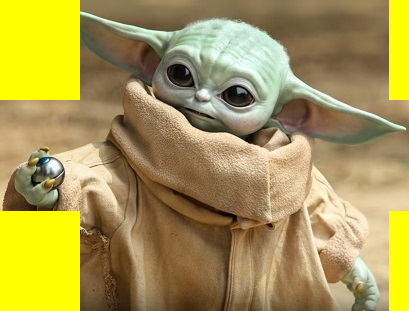

In [6]:
im1 = im.copy()
wstaw_pixel_w_zakresie(im1, -20, -100, (255, 255, 0), 100, 200)



In [7]:
def rozjasnij_obraz_w_zakresie(obraz, m, n, a, b, c, w_z,
                               h_z):  # w miejscu m,n "rozjaśnia" prostokat o wymiaraxh w_z, h_z
    obraz1 = obraz.copy()
    w, h = obraz.size
    for i, j in zakres(w_z, h_z):
        if i + m < w and j + n < h:
            p = obraz.getpixel((i + m, j + n))
            obraz1.putpixel((i + m, j + n), (p[0] + a, p[1] + b, p[2] + c))
    return obraz1

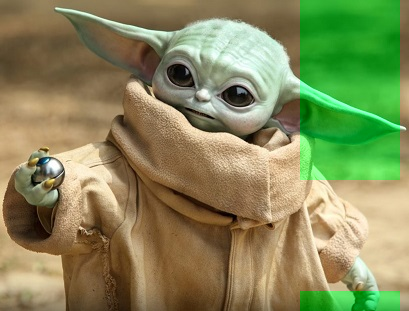

In [8]:
im2 = im.copy()
rozjasnij_obraz_w_zakresie(im2, 300, -20, -100, 50, -40, 100, 200)

In [9]:
def skopiuj_obraz_w_zakresie(obraz, m, n, m1, n1, w_z,
                             h_z):  # kopiuje prostokat o wymiarach w_z, h_z z miejsca m,n i wstawia w miejscu m1,n1
    obraz1 = obraz.copy()
    w, h = obraz.size
    for i, j in zakres(w_z, h_z):
        if i + m < w and j + n < h:
            p = obraz.getpixel((i + m, j + n))
            if i + m1 < w and j + n1 < h:
                obraz1.putpixel((i + m1, j + n1), p)
    return obraz1

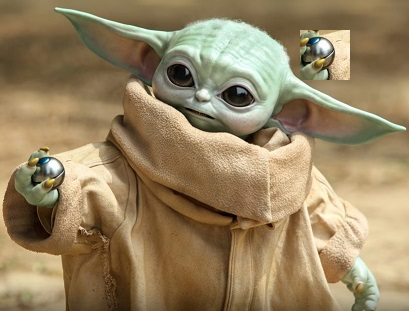

In [10]:
im3 = im.copy()
skopiuj_obraz_w_zakresie(im3, 30, 150, 300, 30, 50, 50)

In [11]:
def rozjasnij_obraz_z_maska(obraz, maska, m, n, a, b,
                            c):  # w miejscu m, n zmienia tylko te pixele, które odpowiadają czarnym pixelom maski, maska jest obrazem czarnobiałym
    obraz1 = obraz.copy()
    w, h = obraz.size
    w0, h0 = maska.size
    for i, j in zakres(w0, h0):
        if i + m < w and j + n < h:
            if maska.getpixel((i, j)) == 0:
                p = obraz.getpixel((i + m, j + n))
                obraz1.putpixel((i + m, j + n), (p[0] + a, p[1] + b, p[2] + c))
    return obraz1

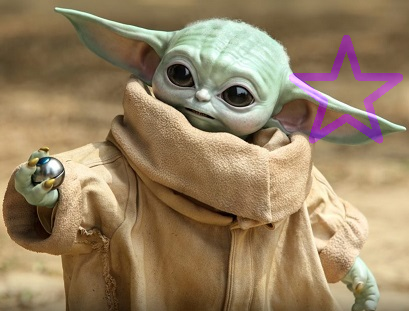

In [12]:
im4 = im.copy()
maska = Image.open('gwiazdka.bmp')
rozjasnij_obraz_z_maska(im4, maska, 270, 0, 20, -50, 80)

In [13]:
def dodaj_szum(obraz, n, kolor1, kolor2):  # dodawanie szumu typu salt and pepper
    w, h = obraz.size
    x, y = np.random.randint(0, w, n), np.random.randint(0, h,
                                                         n)  # powtarza n razy losowanie z zakresu 0,w i z zakresu 0,h
    for (i, j) in zip(x, y):  # zip robi pary z list x,y
        obraz.putpixel((i, j), (kolor1 if np.random.rand() < 0.5 else kolor2))  # salt-and-pepper
    return obraz

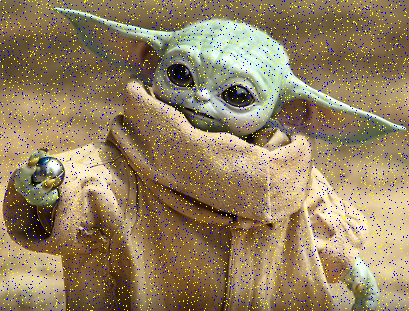

In [14]:
im5 = im.copy()
dodaj_szum(im5, 10000, (255, 255, 0), (0, 0, 255))

zmiana wartości pikseli za pomocą metody  load

In [15]:
def zastosuj_funkcje(image, func):
    w, h = image.size
    pixele = image.load()
    for i, j in zakres(w, h):
        pixele[i, j] = func(pixele[i, j])



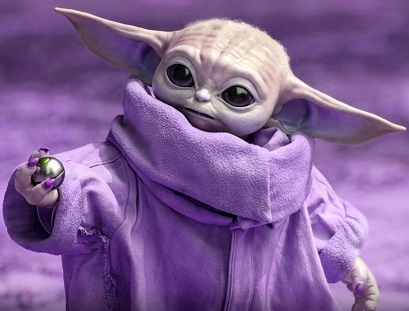

In [16]:
def przestaw_kolory(pixel):
    return (pixel[1], pixel[2], pixel[0])


im6 = im.copy()
zastosuj_funkcje(im6, przestaw_kolory)
im6

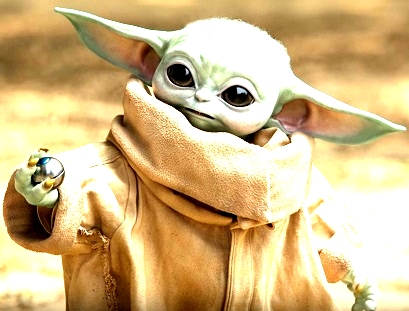

In [17]:
def filtr_liniowy(image, a, b):  # a, b liczby całkowite
    w, h = image.size
    pixele = image.load()
    for i, j in zakres(w, h):
        pixele[i, j] = (pixele[i, j][0] * a + b, pixele[i, j][1] * a + b, pixele[i, j][2] * a + b)


im7 = im.copy()
filtr_liniowy(im7, 2, -50)
im7

zmiana wartości pikseli za pomocą metody  point

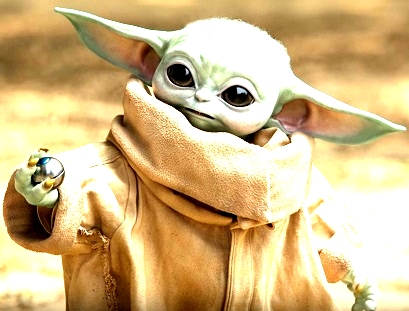

In [18]:
def filtr_liniowy_point(image, a, b):
    return image.point(lambda i: i * a + b)


im8 = im.copy()
filtr_liniowy_point(im8, 2, -50)

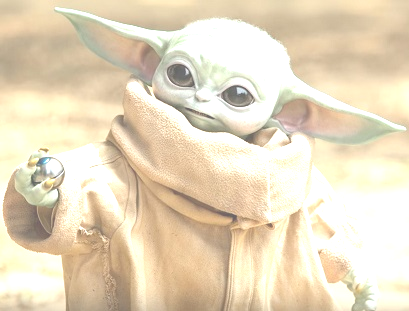

In [19]:
filtr_liniowy_point(im8, 1, 100)  # rozjaśnia każdy piksel o 100

negatyw

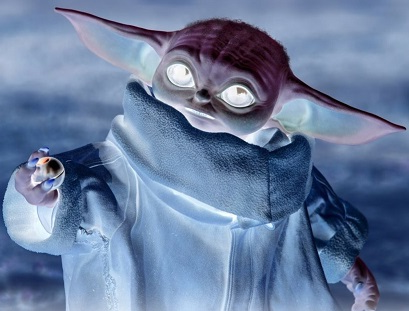

In [20]:
def utworz_negatyw(image):
    return image.point(lambda i: 255 - i)


utworz_negatyw(im8)

binaryzacja 

In [21]:
def efekt_plakatu(image, wsp):
    return image.point(
        lambda i: i > wsp and 255)  # jeżeli nieprawda, że i > wsp wstaw 0 a w przeciwnym przypadku wstaw 255

metoda point z wykorzystaniem listy

In [22]:
def efekt_plakatu_lista(image, wsp):
    listaL = [0 if i <= wsp else 255 for i in range(256)]
    listaRGB = listaL + listaL + listaL
    return image.point(listaRGB)


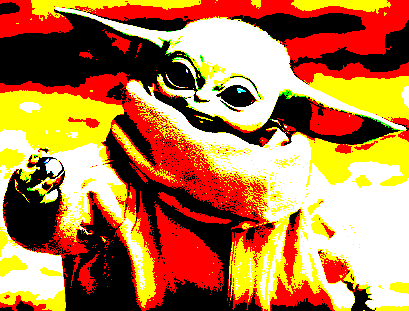

In [23]:

efekt_plakatu(im8, 120)

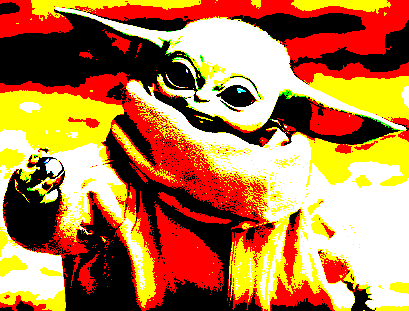

In [24]:
efekt_plakatu_lista(im8, 120)

 dlaczego poniższa funkcja nie rozjasnia obrazu tak jak "filtr_liniowy_point(image, 1, 100)"

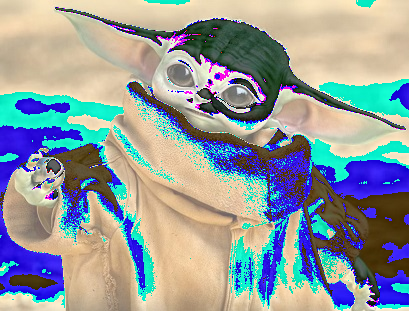

In [25]:
# dlaczego poniższa funkcja nie rozjasnia obrazu tak jak "filtr_liniowy_point(image, 1, 100)"

def rozjasnij(image, b):
    im = image.copy()
    T = np.array(im, dtype='uint8')
    T += b
    return Image.fromarray(T, "RGB")


rozjasnij(im8, 100)


1. Wczytaj pod nazwą obraz obrazek wybrany na wcześniejszych zajęciach.
Przekształcenia wykonuj na kopii tego obrazu. Wczytaj obraz czarnobiały obraz z inicjałami (z lab1) pod nazwą inicjaly.

In [26]:
obraz = Image.open('im.png')
inicjaly = Image.open('inicjaly.bmp')

2. Korzystając z metod getpixel i putpixel:\
    a. Napisz funkcję wstaw_inicjaly(obraz, inicjaly, m, n, kolor), gdzie m, n są współrzędnymi punktu, w którym wstawimy w obraz, inicjaly w kolorze równym wartości kolor. Utwórz i zapisz obraz1, w którym inicjały w kolorze czerwonym są wstawione tak, że prawy dolny róg obrazu inicjaly pokrywa się z prawym dolnym rogiem obrazu.\
    b. Analogicznie do funkcji rozjasnij_obraz_z_maska, napisz funkcję wstaw_inicjaly_maska(obraz, inicjaly, m, n), gdzie m, n są współrzędnymi punktu, w którym traktując inicjały jako maskę zmienimy piksele odpowiadające czarnym pikselom z maski na ich negatywy. Utwórz i zapisz obraz2, w którym maska jest wstawiona mniej więcej na środku obrazu.

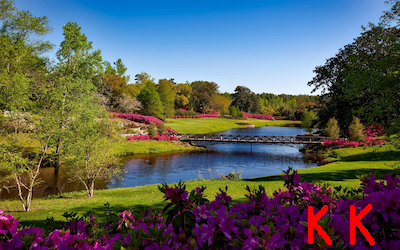

In [27]:
def wstaw_inicjaly(obraz, inicjaly, m, n, kolor):
    obraz_copy = obraz.copy()
    w_i, h_i = inicjaly.size

    for i in range(w_i):
        for j in range(h_i):
            if inicjaly.getpixel((i, j)) == 0:
                obraz_copy.putpixel((m + i, n + j), tuple(kolor))
    return obraz_copy


im_inicjaly = wstaw_inicjaly(obraz, inicjaly, -100, -50, [255, 0, 0])
im_inicjaly


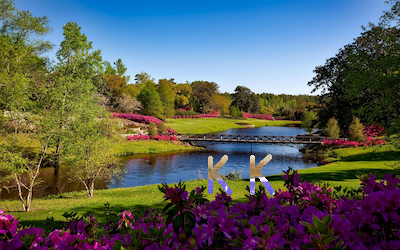

In [28]:
def wstaw_inicjaly_maska(obraz, inicjaly, m, n):
    obraz_copy = obraz.copy()
    w_i, h_i = inicjaly.size

    for i in range(w_i):
        for j in range(h_i):
            if inicjaly.getpixel((i, j)) == 0:
                p = obraz_copy.getpixel((m + i, n + j))
                obraz_copy.putpixel((m + i, n + j), (255 - p[0], 255 - p[1], 255 - p[2]))
    return obraz_copy


im_inicjaly_maska = wstaw_inicjaly_maska(obraz, inicjaly, 200, 150)
im_inicjaly_maska

3. Stosując metodę load napisz funkcje wstaw_inicjaly_load(obraz, inicjaly, m, n, kolor) oraz wstaw_inicjaly_maska(obraz, inicjaly, m, n, x, y, z) działające identycznie jak funkcje z pkt. 2.a, 2.b. Przetestuj je z tymi samymi ustawieniami co w zadaniu 2. Wyniki testu przedstaw na diagramie plt (pod nazwą fig1.png).

In [29]:
def wstaw_inicjaly_load(obraz, inicjaly, m, n, kolor):
    obraz_copy = obraz.copy()
    pix_inicjaly = inicjaly.load()
    pix_obraz = obraz_copy.load()
    w_i, h_i = inicjaly.size

    for i in range(w_i):
        for j in range(h_i):
            if pix_inicjaly[i, j] == 0:
                pix_obraz[m + i, n + j] = tuple(kolor)
    return obraz_copy


im_inicjaly_load = wstaw_inicjaly_load(obraz, inicjaly, -100, -50, [255, 0, 0])


def wstaw_inicjaly_maska_load(obraz, inicjaly, m, n):
    obraz_copy = obraz.copy()
    pix_inicjaly = inicjaly.load()
    pix_obraz = obraz_copy.load()
    w_i, h_i = inicjaly.size

    for i in range(w_i):
        for j in range(h_i):
            if pix_inicjaly[i, j] == 0:
                p = pix_obraz[m + i, n + j]
                pix_obraz[m + i, n + j] = (255 - p[0], 255 - p[1], 255 - p[2])
    return obraz_copy


im_inicjaly_maska_load = wstaw_inicjaly_maska_load(obraz, inicjaly, 200, 150)

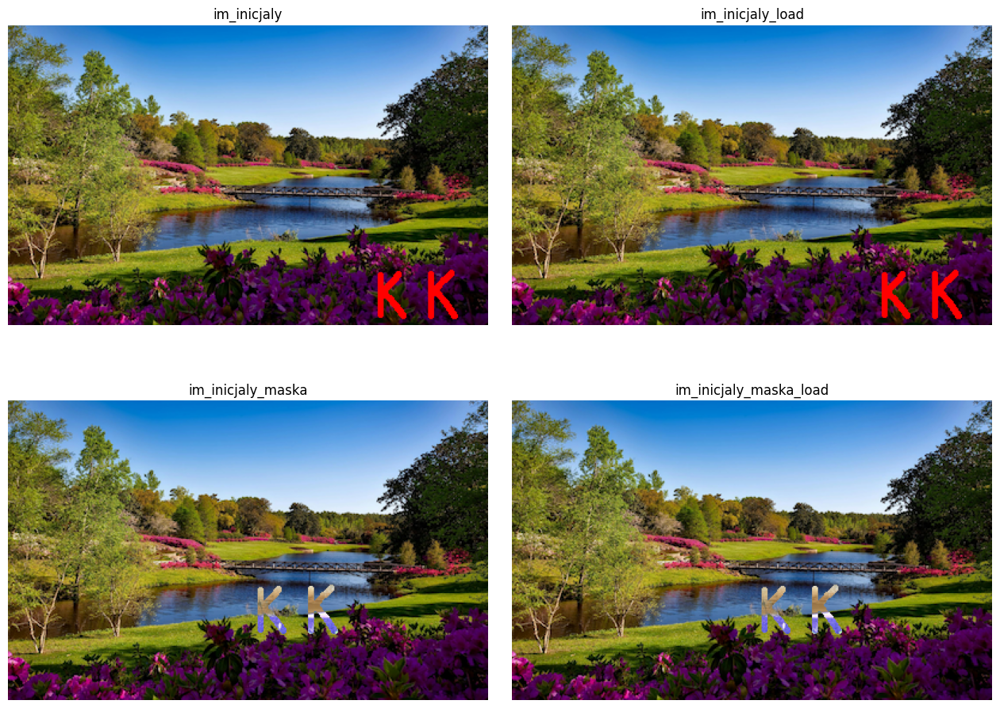

In [30]:
plt.figure(figsize=(16, 12))
plt.subplot(2, 2, 1)
plt.title("im_inicjaly")
plt.axis('off')
plt.imshow(im_inicjaly)
plt.subplot(2, 2, 2)
plt.title("im_inicjaly_load")
plt.axis('off')
plt.imshow(im_inicjaly_load)
plt.subplot(2, 2, 3)
plt.title("im_inicjaly_maska")
plt.axis('off')
plt.imshow(im_inicjaly_maska)
plt.subplot(2, 2, 4)
plt.title("im_inicjaly_maska_load")
plt.axis('off')
plt.imshow(im_inicjaly_maska_load)
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.savefig('fig1.png')
plt.show()

4. Stosując metodę point i funkcję lambda:\
    a. Napisz funkcję kontrast(obraz, wsp_kontrastu), która działa tak, że każdy piksel i zmienia wartość zgodnie z funkcją kontrastu \
    f(i) = 128 + (i -128) * mn, gdzie\
    mn = (( 255 + wsp_kontrastu) /255) **2, a wsp_kontrastu przyjmuje wartości o 0 do 100\
    Przetestuj różne wartości wsp_kontrastu oraz obraz oryginalny i 3 różne obrazy z testu umieść na diagramie plt (pod nazwą fig2.png). Napisz w raporcie jak wartości wsp_kontrastu wpływają na uzyskany efekt\
    \
    b. Napisz funkcję transformacja_logarytmiczna(obraz), która działa tak, że każdy piksel i zmienia wartość zgodnie z funkcją\
    f(i) = 255 * np.log(1 + i / 255\
    Obraz oryginalny, obraz uzyskany po zastosowaniu tej funkcji i obraz po zastosowaniu funkcji filtru liniowego dla a=2 i b =100 umieść na diagramie plt (pod nazwą fig3.png). Napisz w raporcie czym różnią się te 3 obrazy.\
    \
    c. Napisz funkcję transformacja_gamma (obraz, gamma), która działa tak, że każdy piksel i zmienia wartość zgodnie z funkcją\
    f(i) = (i / 255) ** (1 / gamma) * 255), gdzie gamma jest współczynnikiem większym od zera, ale może też być zarówno ułamkiem jak i liczbą całkowitą w zakresie do 100. Podobnie jak w 4a. przetestuj różne wartości gamma i napisz w raporcie jak wartości gamma wpływają na uzyskany efekt oraz umieść na diagramie plt (pod nazwą fig4.png)

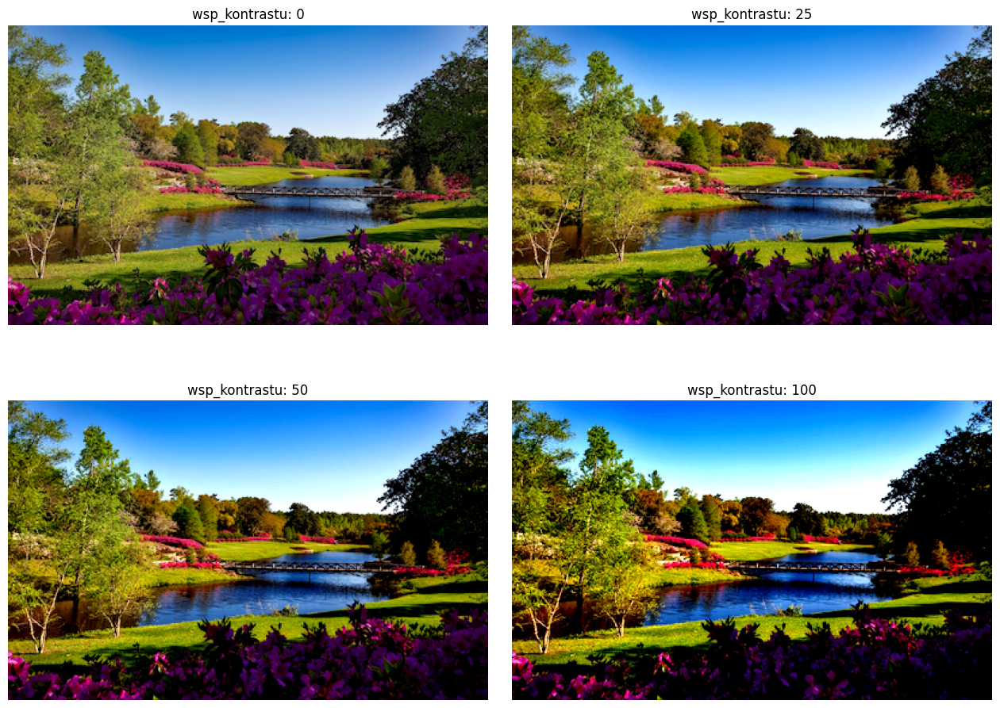

In [31]:
def kontrast(obraz, wsp_kontrastu):
    mn = (((255 + wsp_kontrastu) / 255) ** 2)
    return obraz.point(lambda i: 128 + (i - 128) * mn)


im_kontrast_0 = kontrast(obraz, 0)
im_kontrast_25 = kontrast(obraz, 25)
im_kontrast_50 = kontrast(obraz, 50)
im_kontrast_100 = kontrast(obraz, 100)

plt.figure(figsize=(16, 12))
plt.subplot(2, 2, 1)
plt.title("wsp_kontrastu: 0")
plt.axis('off')
plt.imshow(im_kontrast_0)
plt.subplot(2, 2, 2)
plt.title("wsp_kontrastu: 25")
plt.axis('off')
plt.imshow(im_kontrast_25)
plt.subplot(2, 2, 3)
plt.title("wsp_kontrastu: 50")
plt.axis('off')
plt.imshow(im_kontrast_50)
plt.subplot(2, 2, 4)
plt.title("wsp_kontrastu: 100")
plt.axis('off')
plt.imshow(im_kontrast_100)
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.savefig('fig2.png')
plt.show()

Przy wyższych wartościach współczynnika kontrastu barwy stają się bardzo nasycone, intensywne.

b. Napisz funkcję transformacja_logarytmiczna(obraz), która działa tak, że każdy piksel i zmienia wartość zgodnie z funkcją\
    f(i) = 255 * np.log(1 + i / 255)\
    Obraz oryginalny, obraz uzyskany po zastosowaniu tej funkcji i obraz po zastosowaniu funkcji filtru liniowego dla a=2 i b =100 umieść na diagramie plt (pod nazwą fig3.png). Napisz w raporcie czym różnią się te 3 obrazy.

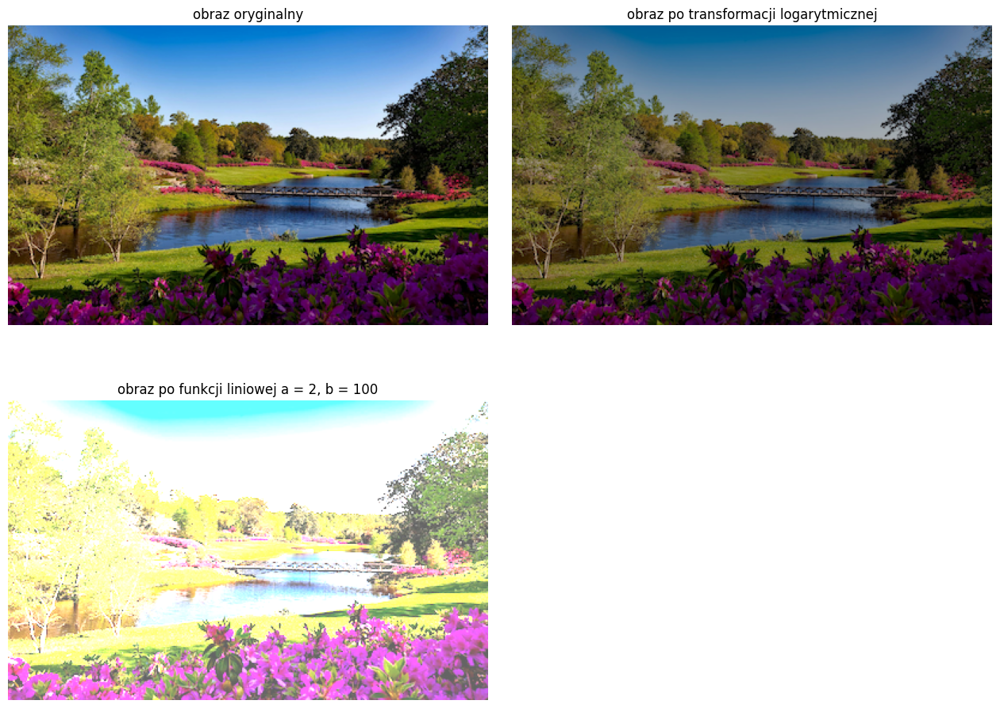

In [32]:
def transformacja_logarytmiczna(obraz):
    return obraz.point(lambda i: 255 * np.log(1 + i / 255))


def filtr_liniowy_point(image, a, b):
    return obraz.point(lambda i: i * a + b)


im_transform_log = transformacja_logarytmiczna(obraz)
im_filtr_liniowy = filtr_liniowy_point(obraz, 2, 100)

plt.figure(figsize=(16, 12))
plt.subplot(2, 2, 1)
plt.title("obraz oryginalny")
plt.axis('off')
plt.imshow(obraz)
plt.subplot(2, 2, 2)
plt.title("obraz po transformacji logarytmicznej")
plt.axis('off')
plt.imshow(im_transform_log)
plt.subplot(2, 2, 3)
plt.title("obraz po funkcji liniowej a = 2, b = 100")
plt.axis('off')
plt.imshow(im_filtr_liniowy)
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.savefig('fig3.png')
plt.show()

Obraz po transformacji logarytmicznej lekko stracił swoją jasność a obraz po funkcji liniowej stał się o wiele jaśniejszy.

c. Napisz funkcję transformacja_gamma (obraz, gamma), która działa tak, że każdy piksel i zmienia wartość zgodnie z funkcją\
    f(i) = (i / 255) ** (1 / gamma) * 255), gdzie gamma jest współczynnikiem większym od zera, ale może też być zarówno ułamkiem jak i liczbą całkowitą w zakresie do 100. Podobnie jak w 4a. przetestuj różne wartości gamma i napisz w raporcie jak wartości gamma wpływają na uzyskany efekt oraz umieść na diagramie plt (pod nazwą fig4.png)

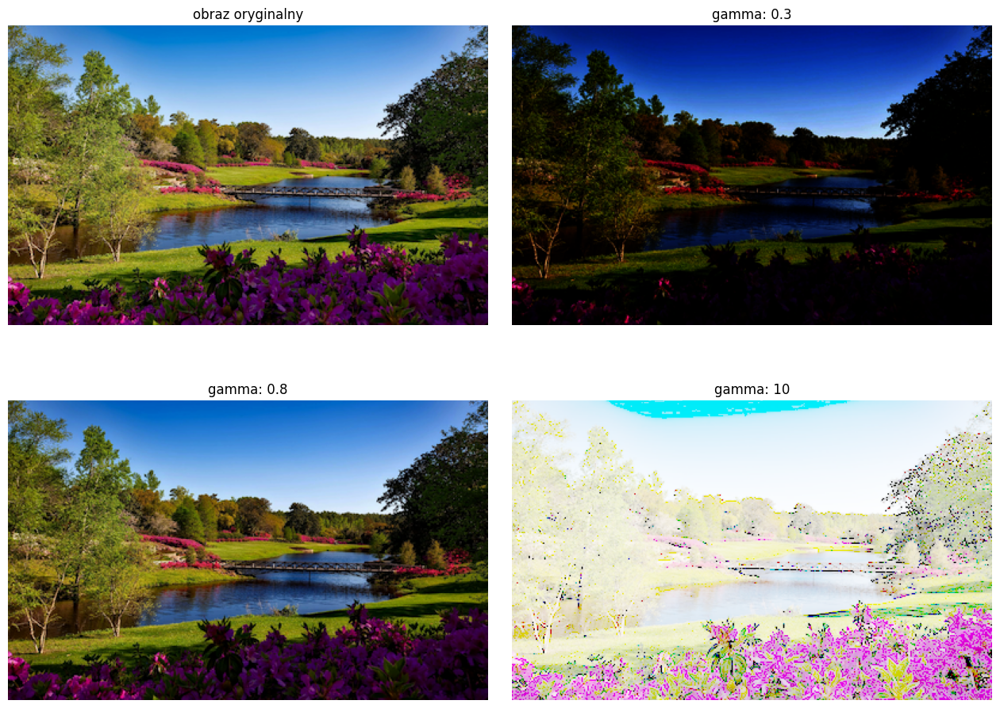

In [33]:
def transformacja_gamma(obraz, gamma):
    return obraz.point(lambda i: (i / 255) ** (1 / gamma) * 255)


im_gamma_03 = transformacja_gamma(obraz, 0.3)
im_gamma_08 = transformacja_gamma(obraz, 0.8)
im_gamma_10 = transformacja_gamma(obraz, 10)

plt.figure(figsize=(16, 12))
plt.subplot(2, 2, 1)
plt.title("obraz oryginalny")
plt.axis('off')
plt.imshow(obraz)
plt.subplot(2, 2, 2)
plt.title("gamma: 0.3")
plt.axis('off')
plt.imshow(im_gamma_03)
plt.subplot(2, 2, 3)
plt.title("gamma: 0.8")
plt.axis('off')
plt.imshow(im_gamma_08)
plt.subplot(2, 2, 4)
plt.title("gamma: 10")
plt.axis('off')
plt.imshow(im_gamma_10)
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.savefig('fig4.png')
plt.show()

Ustawienie wartości gammy na wartości mniejsze od 1, oznacza ściemnienie obrazu wyjściowego. Natomiast ustawienie gammy powyżej 1, znacznie rozjaśnia obraz.

5. Stosując metodę point i listę napisz funkcję transformacja_gamma_lista(obraz, gamma), która działa jak w pkt 4c.\
    a. Zastosuj na swoim obrazie funkcję transformacja_gamma (obraz, gamma) oraz funkcję transformacja_gamma_lista(obraz, gamma), przyjmując gamma = 0.5. Porównaj otrzymane obrazy

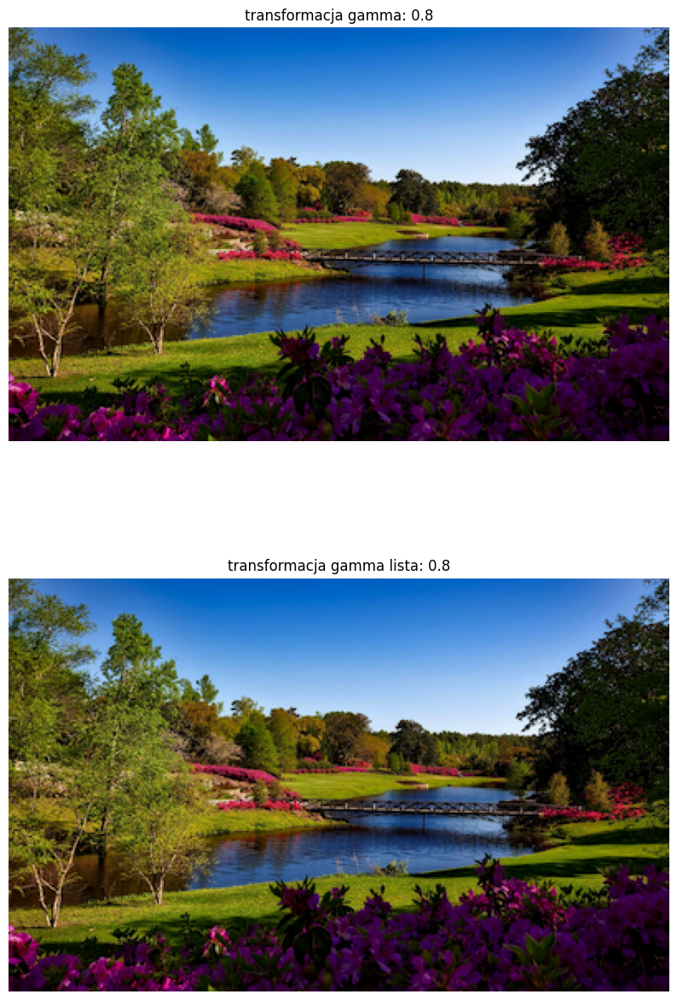

In [34]:
def transformacja_gamma_lista(obraz, gamma):
    lista = [int(((i / 255) ** (1 / gamma)) * 255) for i in range(256)]
    lista = lista * 3  # 3 - ilosc kanalow
    return obraz.point(lista)


im_gamma_lista_08 = transformacja_gamma_lista(obraz, 0.8)
im_gamma_08 = transformacja_gamma(obraz, 0.8)
plt.figure(figsize=(10, 16))
plt.subplot(2, 1, 1)
plt.title("transformacja gamma: 0.8")
plt.axis('off')
plt.imshow(im_gamma_08)
plt.subplot(2, 1, 2)
plt.title("transformacja gamma lista: 0.8")
plt.axis('off')
plt.imshow(im_gamma_lista_08)
plt.subplots_adjust(wspace=0, hspace=0.1)
plt.savefig('fig41.png')
plt.show()

Obrazy nie różnią się.

4. Napisz,\
    a. dlaczego obraz powstały z zastosowania poleceń\
        T = np.array(obraz, dtype='uint8')\
        T += 100\
        obraz_wynik = Image.fromarray(T, "RGB")\
        jest inny niż obraz powstały z zastosowania funkcji\
        obraz.point(lambda i: i + 100)\
    b. Napisz funkcję, która działa na tablicy obrazu i daje taki sam efekt, co obraz.point(lambda i: i + 100)

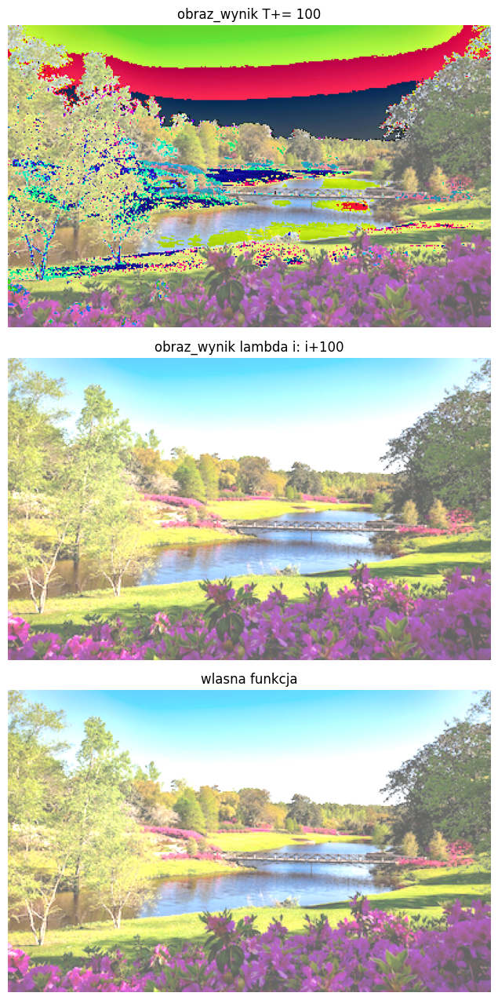

In [35]:
T = np.array(obraz, dtype='uint8')
T += 100
obraz_wynik = Image.fromarray(T, "RGB")
obraz_wynik2 = obraz.point(lambda i: i + 100)


def zad6(obraz):
    T = np.array(obraz, dtype='uint16')
    T += 100
    T[T > 255] = 255
    return Image.fromarray(T.astype(dtype='uint8'), mode="RGB")


obraz_wynik3 = zad6(obraz)

plt.figure(figsize=(8, 16))
plt.subplot(3, 1, 1)
plt.title("obraz_wynik T+= 100")
plt.axis('off')
plt.imshow(obraz_wynik)
plt.subplot(3, 1, 2)
plt.title("obraz_wynik lambda i: i+100")
plt.axis('off')
plt.imshow(obraz_wynik2)
plt.subplot(3, 1, 3)
plt.title("wlasna funkcja")
plt.axis('off')
plt.imshow(obraz_wynik3)
plt.subplots_adjust(wspace=0, hspace=0.1)
plt.savefig('fig6.png')
plt.show()

Numpy robi modulo na wartości większe niż 255, czyli po zwiększeniu 230 o 100 mamy 230+100=330, 330 % 256 = 74.
Z kolei obraz point z lambdą obcina zwiększone wartości do 255, czyli po zwiększeniu 230 o 100 mamy 230+100= 330, min(330, 255) = 255.